In [1]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [2]:
import numpy as np
import os,sys
import matplotlib.pyplot as plt
import netCDF4 as cdf 
from tm5tools import globarea
from matplotlib.pyplot import *
from maptools import select_map
import calendar
import datetime as dt

In [8]:
biomes_sib_koppen=['No biome specified',                                         #0
                  'Tall Broadleaf-Evergreen Trees, Climate = Trop. Rainforest',  #1
                  'Tall Broadleaf-Evergreen Trees, Climate = Trop. Monsoon',     #2
                  'Tall Broadleaf-Evergreen Trees, Climate = Trop. Savannah',    #3
                  'Tall Broadleaf-Evergreen Trees, Outside South America',       #4
                  'Tall Broadleaf-Deciduous Trees',                              #5
                  'Tall Broadleaf and Needleleaf Trees',                         #6
                  'Tall Needleleaf Trees',                                       #7
                  'Tall Needleleaf-Deciduous Trees',                             #8
                  'Short Vegetation (Savanna)',                                  #9
                  'Short Vegetation (Grasslands)',                               #10
                  'Short Vegetation (None)',                                     #11
                  'Short Broadleaf Shrubs - Bare Soil',                          #12
                  'Short Ground Cover (Tundra)',                                 #13
                  'No Vegetation (Low Latitude Desert)',                         #14
                  'Agriculture']                                                 #15

biofireparamdirs = [
'/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/gfed4_daily_sibcasa_3hr/',
#'/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/gfed4_daily_sibcasa_3hr_gfas_fires/',
#'/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/gfed4_daily_sibcasa_3hr_finn_fires/', #FINN
#'/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/casa-gfed4-3h-fires-monthly-bio/', #CASA-GFED4 fires 3h
'/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/casa-gfed4-daily-fires-monthly-bio/'#CASA-GFED4 fires daily
]

lbls  = ['SiBCASA-GFED4', 'GFAS', 'FINN', 'CASA-GFED4']

lbls2 = ['SiBCASA-GFED4','CASA-GFED4']

In [9]:
glarea2 = globarea(im=360,jm=180)
fac1 = 12*24*60*60 #mol/m2/s -> g/m2/day
fac2 = 12*24*60*60*365*1e-15 #mol/m2/s -> PgC/m2/yr
lons=np.arange(-179.5,180,1)
lats=np.arange(-89.5,90,1)
#Mask
f = cdf.Dataset('/Storage/CO2/carbontracker/input/ctdas_2012/regions_sibcasa_koppen_sam.nc')
tc = f.variables['transcom_regions'][:]
f.close()
sam = tc
index = np.where(sam <> 3)
sam[index] = 0
index = np.where(sam <> 0)
sam[index] = 1


In [10]:
def make_map(fill_color = True):
    m,nx,ny = select_map('South America Albers')
    m.drawcoastlines(color='grey',linewidth=0.5)
    m.drawcountries(color='grey',linewidth=0.5) 
    if fill_color:
        m.drawmapboundary(fill_color='#d8d8d8')
        m.drawparallels(np.arange(-90,91,10),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[0,0,0,0],fontsize=13)
        m.drawmeridians(np.arange(-180,180,15),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[0,0,0,0],fontsize=13)
    return m,nx,ny

/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/gfed4_daily_sibcasa_3hr/
2010
2011
2012
2013
2014
2015
/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/gfed4_daily_sibcasa_3hr_gfas_fires/
2010
2011
2012
2013
2014


/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel/__main__.py:27: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.


2015
/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/gfed4_daily_sibcasa_3hr_finn_fires/
2010
2011
2012
2013
2014
2015
/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/casa-gfed4-daily-fires-monthly-bio/
2010
2011
2012
2013
2014
2015


/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


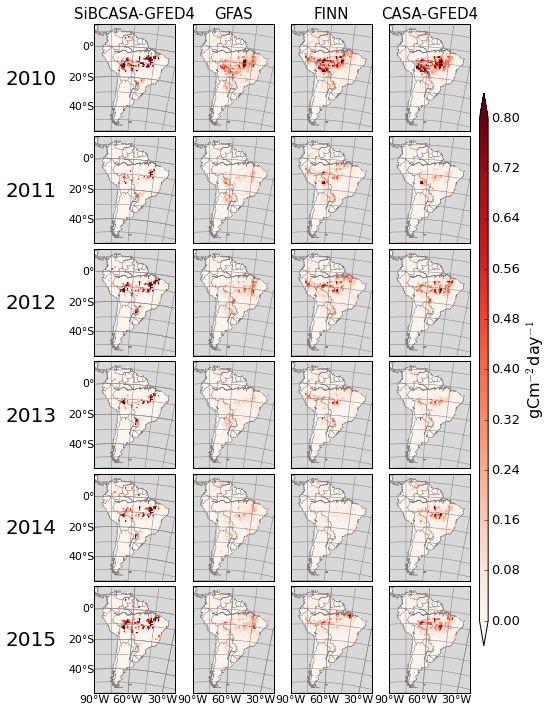

In [6]:
################################### Fire Emissions Spatial Distribution ####################################################

minyear=2010
maxyear=2016

fig = plt.figure(1,figsize=(8,12))

for ii,dirbf in enumerate(biofireparamdirs):
    alltimes = []
    allbb = []
    print dirbf
    for y in range(minyear,maxyear):
        print y
        
        for fname in os.listdir(dirbf):
            
            if fname.startswith('READ'): continue
            if not int(fname[-9:-5]) == y: continue
            bf = cdf.Dataset(dirbf+fname)
            if 'co2fire' in bf.variables.keys():
                bb = np.float32(bf.variables['co2fire'][:])
            else: 
                bb = bf.variables['bb'][:]
            if bb.shape[0] == 180: #add time dimension
                bb.resize(1,180,360)  
            try: 
                bb[bb.mask] = 0
                bb = np.array(bb)
            except: pass    
            if int(fname[-5:-3]) == 1: 
                bb_sum = bb
            else: bb_sum = np.append(bb_sum,bb,axis=0) # revise syntax of append
            bf.close()
        
        bb_sum = bb_sum.mean(axis=0) # Am I taking the annual average here for each grid box? Yes
        bb_year = np.ma.masked_where(sam == 0,bb_sum)
        
        if y == 2010:
            ax1 = plt.subplot2grid((6, 4), (0, ii), colspan=1)
            ax1.set_title(lbls[ii],fontsize=15)
            m,nx,ny = make_map()
            if dirbf == '/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/gfed4_daily_sibcasa_3hr/':
                m.drawparallels(np.arange(-40,10,20),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[1,0,0,0],fontsize=11)
            fluxmap = m.transform_scalar((bb_year)*fac1,lons,lats,nx,ny,order=0)
            q=m.imshow(fluxmap,cmap=get_cmap('Reds'),vmin=0,vmax=0.8)
            
        if y == 2011:
            ax2 = plt.subplot2grid((6, 4), (1, ii), colspan=1)
            fluxmap = m.transform_scalar((bb_year)*fac1,lons,lats,nx,ny,order=0)
            if dirbf == '/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/gfed4_daily_sibcasa_3hr/':
                m.drawparallels(np.arange(-40,10,20),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[1,0,0,0],fontsize=11)
            q=m.imshow(fluxmap,cmap=get_cmap('Reds'),vmin=0,vmax=0.8)
            m,nx,ny = make_map()
            
        if y == 2012:
            ax3 = plt.subplot2grid((6, 4), (2, ii), colspan=1)
            fluxmap = m.transform_scalar((bb_year)*fac1,lons,lats,nx,ny,order=0)
            if dirbf == '/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/gfed4_daily_sibcasa_3hr/':
                m.drawparallels(np.arange(-40,10,20),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[1,0,0,0],fontsize=11)
            q=m.imshow(fluxmap,cmap=get_cmap('Reds'),vmin=0,vmax=0.8)
            m,nx,ny = make_map()
            
        if y == 2013:
            ax4 = plt.subplot2grid((6, 4), (3, ii), colspan=1)
            fluxmap = m.transform_scalar((bb_year)*fac1,lons,lats,nx,ny,order=0)
            if dirbf == '/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/gfed4_daily_sibcasa_3hr/':
                m.drawparallels(np.arange(-40,10,20),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[1,0,0,0],fontsize=11)
            q=m.imshow(fluxmap,cmap=get_cmap('Reds'),vmin=0,vmax=0.8)
            m,nx,ny = make_map()
        
        if y == 2014:
            ax5 = plt.subplot2grid((6, 4), (4, ii), colspan=1)
            fluxmap = m.transform_scalar((bb_year)*fac1,lons,lats,nx,ny,order=0)
            if dirbf == '/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/gfed4_daily_sibcasa_3hr/':
                m.drawparallels(np.arange(-40,10,20),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[1,0,0,0],fontsize=11)
            q=m.imshow(fluxmap,cmap=get_cmap('Reds'),vmin=0,vmax=0.8)
            m,nx,ny = make_map()
            
        if y == 2015:
            ax6 = plt.subplot2grid((6, 4), (5, ii), colspan=1)
            m,nx,ny = make_map()
            if dirbf == '/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/gfed4_daily_sibcasa_3hr/':
                m.drawparallels(np.arange(-40,10,20),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[1,0,0,0],fontsize=11)
            m.drawmeridians(np.arange(-180,180,30),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[0,0,0,1],fontsize=11)
            fluxmap = m.transform_scalar((bb_year)*fac1,lons,lats,nx,ny,order=0)
            q=m.imshow(fluxmap,cmap=get_cmap('Reds'),vmin=0,vmax=0.8)
            
plt.figtext(0.01,0.83,'2010',fontsize=20)
plt.figtext(0.01,0.70,'2011',fontsize=20)
plt.figtext(0.01,0.57,'2012',fontsize=20)
plt.figtext(0.01,0.44,'2013',fontsize=20)
plt.figtext(0.01,0.31,'2014',fontsize=20)
plt.figtext(0.01,0.18,'2015',fontsize=20)

fig.subplots_adjust(right=0.85,top=0.9,wspace=-0.2,hspace=0.05)
cbar_ax = fig.add_axes([0.83, 0.18, 0.015, 0.64]) # left, bottom, width, height
cbar = fig.colorbar(q, cax=cbar_ax, extend='both')
cbar.ax.tick_params(labelsize=13)
cbar.set_label(r'gCm$^{-2}$day$^{-1}$', fontsize = 16)
fig.savefig('SpatialDistribution_FireProducts.png',DPI=1000) # I can add DPI to get higher resolution (200)
plt.show()
plt.close()

/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/gfed4_daily_sibcasa_3hr/
2010
2011
2012
2013
2014
2015
/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/casa-gfed4-daily-fires-monthly-bio/
2010
2011
2012
2013
2014
2015


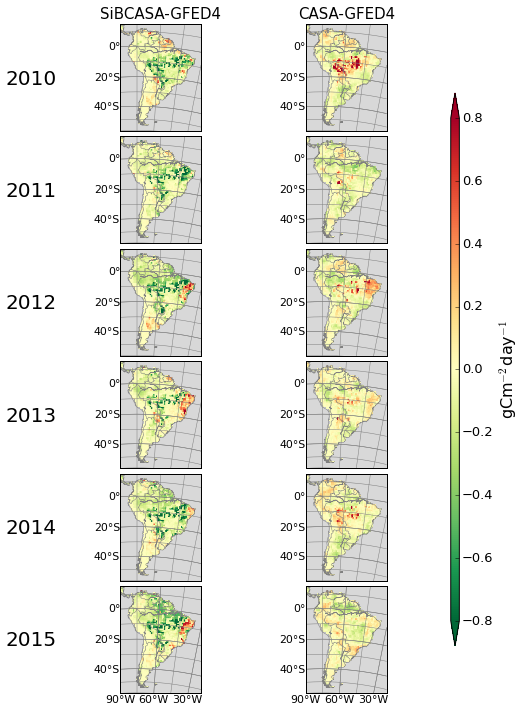

In [11]:
################################### NBE Spatial Distribution ####################################################

minyear=2010
maxyear=2016

fig = plt.figure(1,figsize=(8,12))

for ii,dirbf in enumerate(biofireparamdirs):
    alltimes = []
    allnep = []
    print dirbf
    for y in range(minyear,maxyear):
        print y
        for fname in os.listdir(dirbf):
            if fname.startswith('READ'): continue
            if not int(fname[-9:-5]) == y: continue
            bf = cdf.Dataset(dirbf+fname)
            if 'nep' in bf.variables.keys():
                nep = np.float32(bf.variables['nep'][:])
            if nep.shape[0] == 180: #add time dimension
                nep.resize(1,180,360)  
            try: 
                nep[nep.mask] = 0
                nep = np.array(nep)
            except: pass    
            if int(fname[-5:-3]) == 1: 
                nep_sum = nep
            else: nep_sum = np.append(nep_sum,nep,axis=0) 
            bf.close()
        
        nep_sum = nep_sum.mean(axis=0) 
        nep_year = np.ma.masked_where(sam == 0,nep_sum)
               
        if y == 2010:
            ax1 = plt.subplot2grid((6, 2), (0, ii), colspan=1)
            ax1.set_title(lbls2[ii],fontsize=15)
            m,nx,ny = make_map()    
            fluxmap = m.transform_scalar((nep_year)*fac1,lons,lats,nx,ny,order=0)
            m.drawparallels(np.arange(-40,10,20),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[1,0,0,0],fontsize=11)
            q=m.imshow(fluxmap,cmap=get_cmap('RdYlGn_r'),vmin=-0.8,vmax=0.8)
            
        if y == 2011:
            ax2 = plt.subplot2grid((6, 2), (1, ii), colspan=1)
            fluxmap = m.transform_scalar((nep_year)*fac1,lons,lats,nx,ny,order=0)
            m.drawparallels(np.arange(-40,10,20),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[1,0,0,0],fontsize=11)
            q=m.imshow(fluxmap,cmap=get_cmap('RdYlGn_r'),vmin=-0.8,vmax=0.8)
            m,nx,ny = make_map()
            
        if y == 2012:
            ax3 = plt.subplot2grid((6, 2), (2, ii), colspan=1)
            fluxmap = m.transform_scalar((nep_year)*fac1,lons,lats,nx,ny,order=0)
            m.drawparallels(np.arange(-40,10,20),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[1,0,0,0],fontsize=11)
            q=m.imshow(fluxmap,cmap=get_cmap('RdYlGn_r'),vmin=-0.8,vmax=0.8)
            m,nx,ny = make_map()
            
        if y == 2013:
            ax4 = plt.subplot2grid((6, 2), (3, ii), colspan=1)
            fluxmap = m.transform_scalar((nep_year)*fac1,lons,lats,nx,ny,order=0)
            m.drawparallels(np.arange(-40,10,20),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[1,0,0,0],fontsize=11)
            q=m.imshow(fluxmap,cmap=get_cmap('RdYlGn_r'),vmin=-0.8,vmax=0.8)
            m,nx,ny = make_map()
        
        if y == 2014:
            ax5 = plt.subplot2grid((6, 2), (4, ii), colspan=1)
            fluxmap = m.transform_scalar((nep_year)*fac1,lons,lats,nx,ny,order=0)
            m.drawparallels(np.arange(-40,10,20),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[1,0,0,0],fontsize=11)
            q=m.imshow(fluxmap,cmap=get_cmap('RdYlGn_r'),vmin=-0.8,vmax=0.8)
            m,nx,ny = make_map()
            
        if y == 2015:
            ax6 = plt.subplot2grid((6, 2), (5, ii), colspan=1)
            m,nx,ny = make_map()
            m.drawparallels(np.arange(-40,10,20),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[1,0,0,0],fontsize=11)
            m.drawmeridians(np.arange(-180,180,30),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[0,0,0,1],fontsize=11)
            fluxmap = m.transform_scalar((nep_year)*fac1,lons,lats,nx,ny,order=0)
            q=m.imshow(fluxmap,cmap=get_cmap('RdYlGn_r'),vmin=-0.8,vmax=0.8)
                       
plt.figtext(0.06,0.83,'2010',fontsize=20)
plt.figtext(0.06,0.70,'2011',fontsize=20)
plt.figtext(0.06,0.57,'2012',fontsize=20)
plt.figtext(0.06,0.44,'2013',fontsize=20)
plt.figtext(0.06,0.31,'2014',fontsize=20)
plt.figtext(0.06,0.18,'2015',fontsize=20)

fig.subplots_adjust(right=0.85,top=0.9,wspace=-0.2,hspace=0.05)
cbar_ax = fig.add_axes([0.83, 0.18, 0.015, 0.64]) # left, bottom, width, height
cbar = fig.colorbar(q, cax=cbar_ax, extend='both')
cbar.ax.tick_params(labelsize=13)
cbar.set_label(r'gCm$^{-2}$day$^{-1}$', fontsize = 16)
fig.savefig('SpatialDistribution_NBE.png',bbox_inches='tight',DPI=1000) # I can add DPI to get higher resolution (200)
plt.show()
plt.close()

# Monthly spatial distribution

In [6]:
fire_month_sib_2010 = np.zeros((13,180,360),float)
fire_month_sib_2011 = np.zeros((13,180,360),float)
fire_month_sib_2012 = np.zeros((13,180,360),float)

fire_month_gfas_2010 = np.zeros((13,180,360),float)
fire_month_gfas_2011 = np.zeros((13,180,360),float)
fire_month_gfas_2012 = np.zeros((13,180,360),float)

fire_month_finn_2010 = np.zeros((13,180,360),float)
fire_month_finn_2011 = np.zeros((13,180,360),float)
fire_month_finn_2012 = np.zeros((13,180,360),float)

fire_month_casa_2010 = np.zeros((13,180,360),float)
fire_month_casa_2011 = np.zeros((13,180,360),float)
fire_month_casa_2012 = np.zeros((13,180,360),float)

In [8]:
#biofireparamdirs = ['/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/gfed4_daily_sibcasa_3hr/']

minyear=2010
maxyear=2013

for ii,dirbf in enumerate(biofireparamdirs):
    alltimes = []
    allbb = []
    print dirbf,ii
    for y in range(minyear,maxyear):
        cont = 0
        print y
        for fname in os.listdir(dirbf):
            if fname.startswith('READ'): continue
            if not int(fname[-9:-5]) == y: continue
            bf = cdf.Dataset(dirbf+fname)
            if 'co2fire' in bf.variables.keys():
                bb = np.float32(bf.variables['co2fire'][:])
            else: 
                bb = bf.variables['bb'][:]
            if bb.shape[0] == 180: #add time dimension
                bb.resize(1,180,360)  
            try: 
                bb[bb.mask] = 0
                bb = np.array(bb)
            except: pass    
            
            bb_month = bb.mean(axis=0)
            cont += 1
            print y, shape(bb_month),bb_month.sum(), cont
            
            if ii == 0:
                if y == 2010:
                    fire_month_sib_2010[cont] = bb_month
                if y == 2011:
                    fire_month_sib_2011[cont] = bb_month
                if y == 2012:
                    fire_month_sib_2012[cont] = bb_month
            if ii == 1:
                if y == 2010:
                    fire_month_gfas_2010[cont] = bb_month
                if y == 2011:
                    fire_month_gfas_2011[cont] = bb_month
                if y == 2012:
                    fire_month_gfas_2012[cont] = bb_month
            if ii == 2:
                if y == 2010:
                    fire_month_finn_2010[cont] = bb_month
                if y == 2011:
                    fire_month_finn_2011[cont] = bb_month
                if y == 2012:
                    fire_month_finn_2012[cont] = bb_month
            if ii == 3:
                if y == 2010:
                    fire_month_casa_2010[cont] = bb_month
                if y == 2011:
                    fire_month_casa_2011[cont] = bb_month
                if y == 2012:
                    fire_month_casa_2012[cont] = bb_month
                    
            


/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/gfed4_daily_sibcasa_3hr/ 0
2010
2010 (180, 360) 0.000507119 1
2010 (180, 360) 0.000235757 2
2010 (180, 360) 0.000634833 3
2010 (180, 360) 0.000160111 4
2010 (180, 360) 0.000202361 5
2010 (180, 360) 0.000433495 6
2010 (180, 360) 0.000679414 7
2010 (180, 360) 0.00123229 8
2010 (180, 360) 0.000863435 9
2010 (180, 360) 0.000137773 10
2010 (180, 360) 0.000135073 11
2010 (180, 360) 0.000530096 12
2011
2011 (180, 360) 0.00050377 1
2011 (180, 360) 0.000191308 2
2011 (180, 360) 0.000301998 3
2011 (180, 360) 0.000108896 4
2011 (180, 360) 0.000248981 5
2011 (180, 360) 0.000369398 6
2011 (180, 360) 0.000596056 7
2011 (180, 360) 0.000442314 8
2011 (180, 360) 0.000513824 9
2011 (180, 360) 0.00014845 10
2011 (180, 360) 0.000154301 11
2011 (180, 360) 0.000574049 12
2012
2012 (180, 360) 0.00056869 1
2012 (180, 360) 0.000280909 2
2012 (180, 360) 0.000365853 3
2012 (180, 360) 0.000136838 4
2012 (180, 360) 0.000255471 5
2012 (180, 360) 0.000540041 6
20

/opt/local/Library/Frameworks/Python.framework/Versions/2.7/lib/python2.7/site-packages/ipykernel/__main__.py:24: MaskedArrayFutureWarning: setting an item on a masked array which has a shared mask will not copy the mask and also change the original mask array in the future.
Check the NumPy 1.11 release notes for more information.


2012 (180, 360) 0.000189738 12
/Storage/CO2/carbontracker/input/ctdas_2012/biosphere/casa-gfed4-daily-fires-monthly-bio/ 3
2010
2010 (180, 360) 0.000376967 1
2010 (180, 360) 0.000241837 2
2010 (180, 360) 0.000338653 3
2010 (180, 360) 0.00021445 4
2010 (180, 360) 0.000244105 5
2010 (180, 360) 0.000524752 6
2010 (180, 360) 0.000798781 7
2010 (180, 360) 0.00139045 8
2010 (180, 360) 0.00106975 9
2010 (180, 360) 0.000324114 10
2010 (180, 360) 0.000202522 11
2010 (180, 360) 0.000359105 12
2011
2011 (180, 360) 0.000369834 1
2011 (180, 360) 0.000228658 2
2011 (180, 360) 0.000186321 3
2011 (180, 360) 0.000190475 4
2011 (180, 360) 0.000346846 5
2011 (180, 360) 0.00052267 6
2011 (180, 360) 0.000762665 7
2011 (180, 360) 0.000756237 8
2011 (180, 360) 0.000905882 9
2011 (180, 360) 0.000350793 10
2011 (180, 360) 0.000241536 11
2011 (180, 360) 0.000425742 12
2012
2012 (180, 360) 0.000415962 1
2012 (180, 360) 0.000243957 2
2012 (180, 360) 0.000257563 3
2012 (180, 360) 0.000252172 4
2012 (180, 360) 0.00

In [9]:
fire_2010 = [fire_month_sib_2010,fire_month_gfas_2010,fire_month_finn_2010,fire_month_casa_2010] 
fire_2011 = [fire_month_sib_2011,fire_month_gfas_2011,fire_month_finn_2011,fire_month_casa_2011]
fire_2012 = [fire_month_sib_2012,fire_month_gfas_2012,fire_month_finn_2012,fire_month_casa_2012]

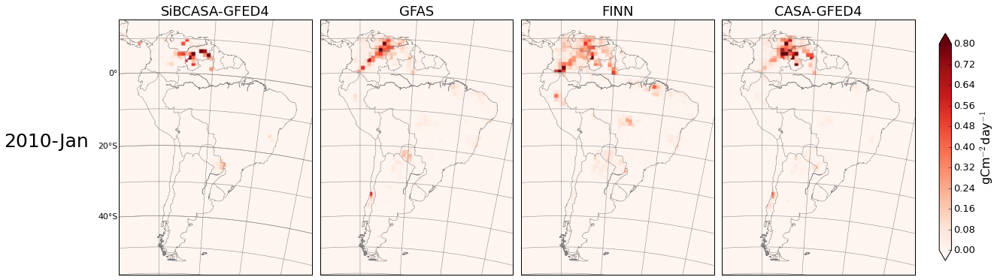

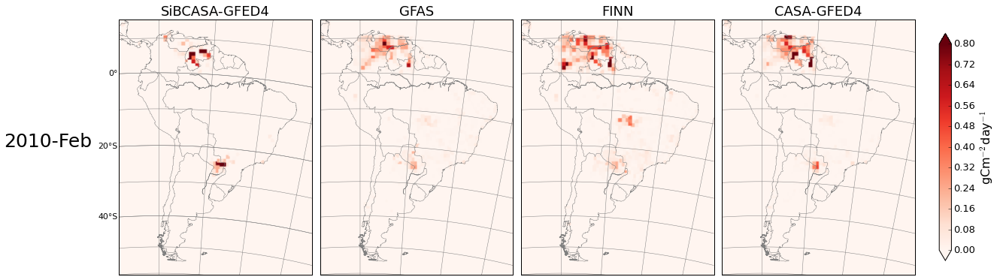

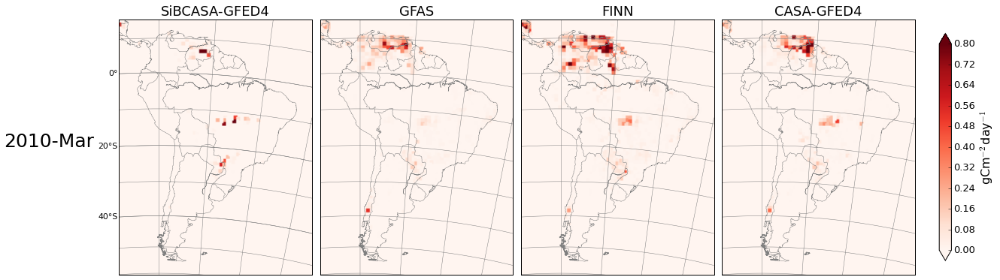

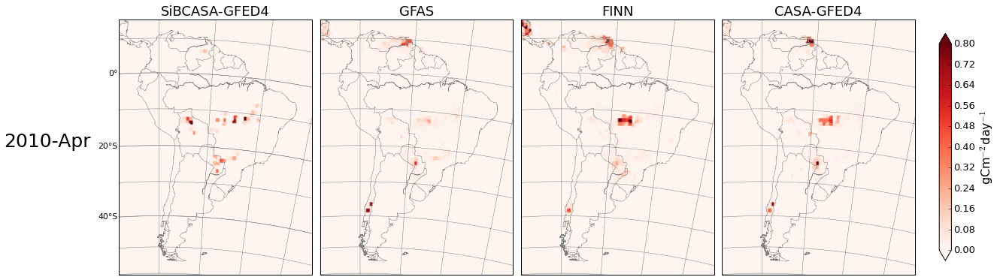

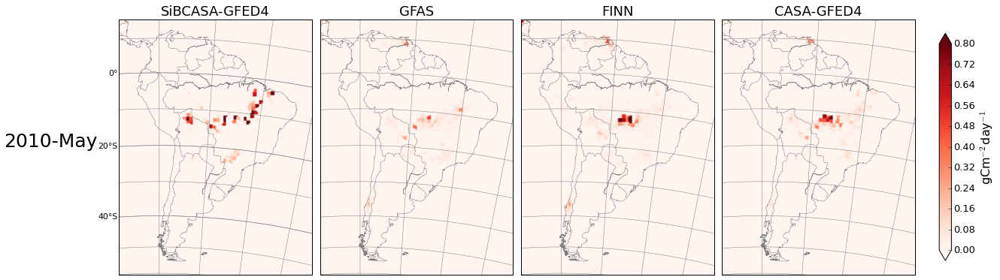

...

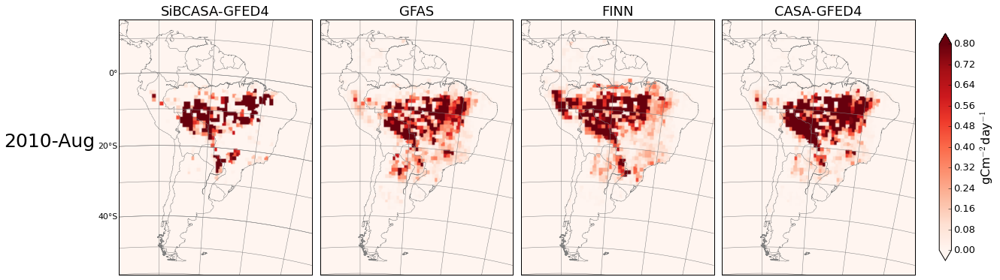

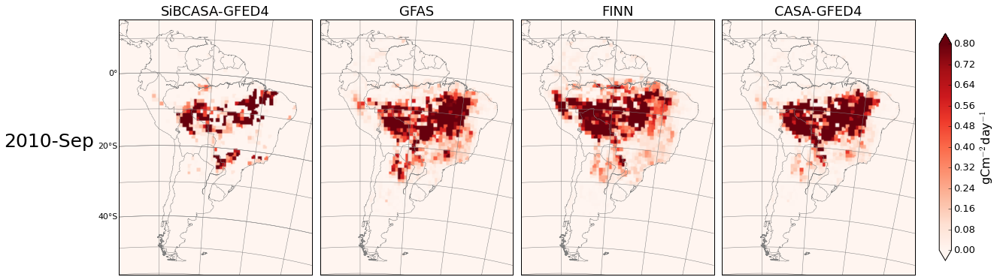

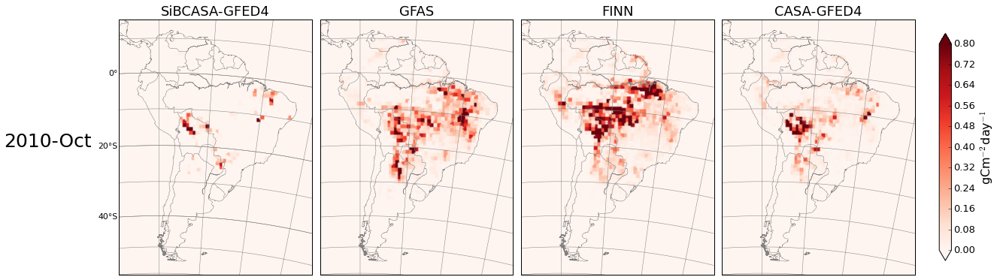

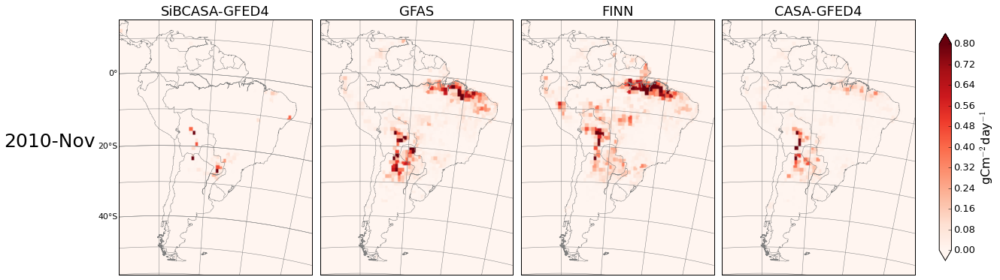

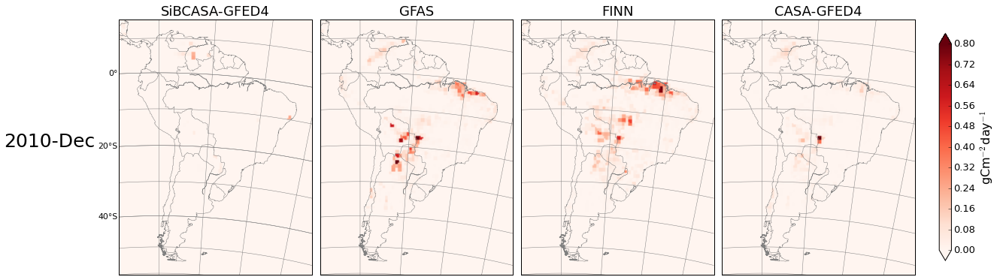

In [29]:
mon = ['nalgas','Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

for month in range (1,13):
    fig = plt.figure(1,figsize=(15,7))
    for ii in range(4):
        ax1 = plt.subplot2grid((1, 4), (0, ii), colspan=1)
        ax1.set_title(lbls[ii],fontsize=18)
        m,nx,ny = make_map()
        if ii == 0:
            m.drawparallels(np.arange(-40,10,20),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[1,0,0,0],fontsize=11)
        fluxmap = m.transform_scalar((fire_2010[ii][month])*fac1,lons,lats,nx,ny,order=0)
        q=m.imshow(fluxmap,cmap=get_cmap('Reds'),vmin=0,vmax=0.8)
        
    plt.figtext(-0.13,0.5,'2010-%s'%(mon[month]),fontsize=25)
    fig.subplots_adjust(right=1,top=0.9,wspace=0.2,hspace=0.05)
    cbar_ax = fig.add_axes([1.02, 0.2, 0.015, 0.6]) # left, bottom, width, height
    cbar = fig.colorbar(q, cax=cbar_ax, extend='both')
    cbar.ax.tick_params(labelsize=13)
    cbar.set_label(r'gCm$^{-2}$day$^{-1}$', fontsize = 16)
    plt.tight_layout()
    fig.savefig('SpatialDistribution_FireProducts%i%i.png'%(2010,month), bbox_inches='tight',DPI=1000) # I can add DPI to get higher resolution (200)
    plt.show()
    plt.close()    


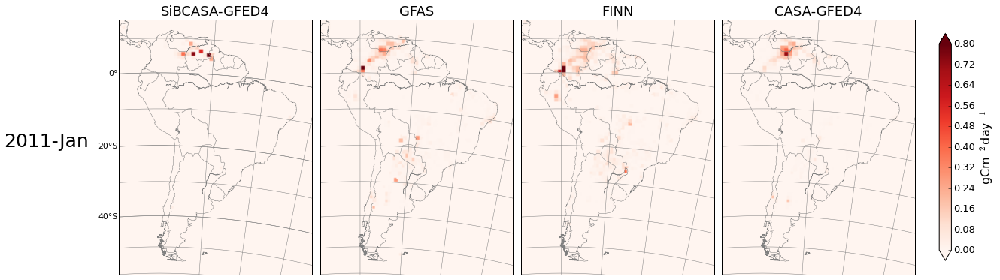

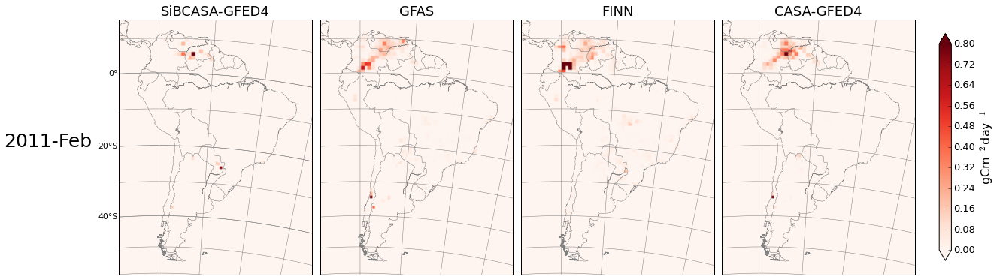

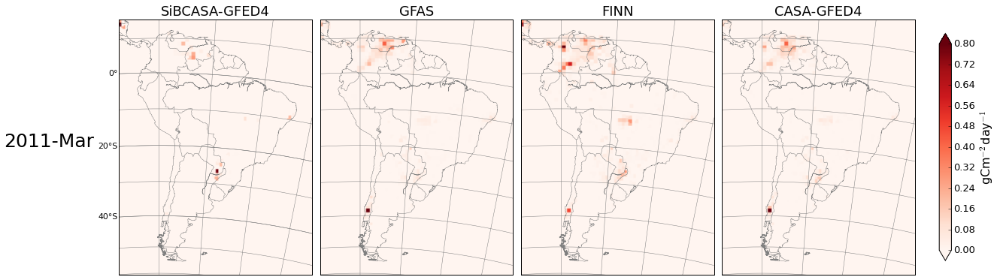

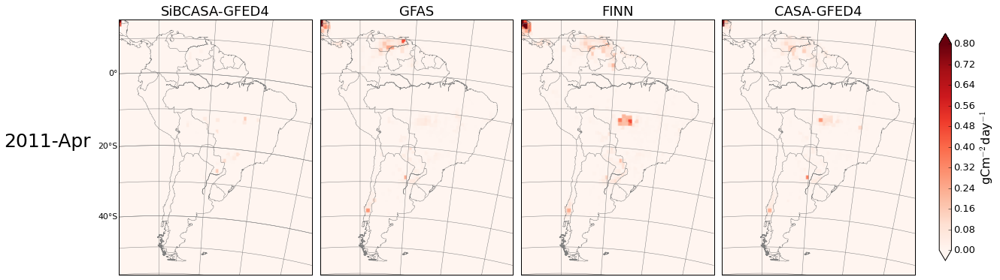

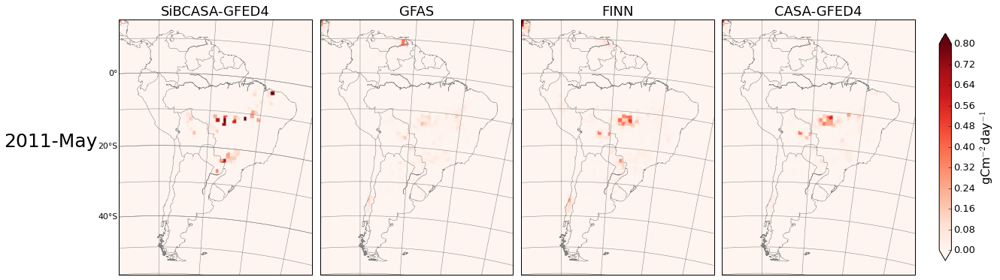

...

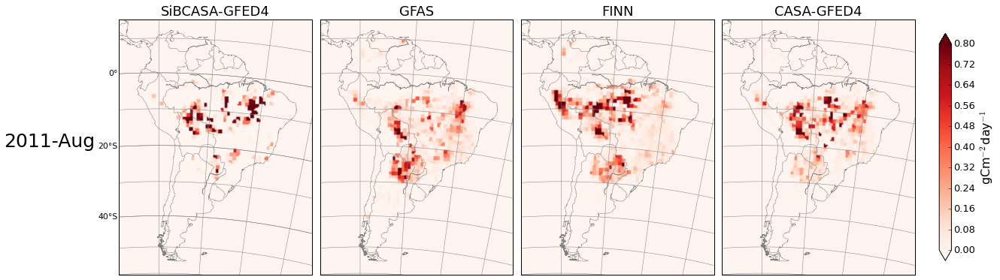

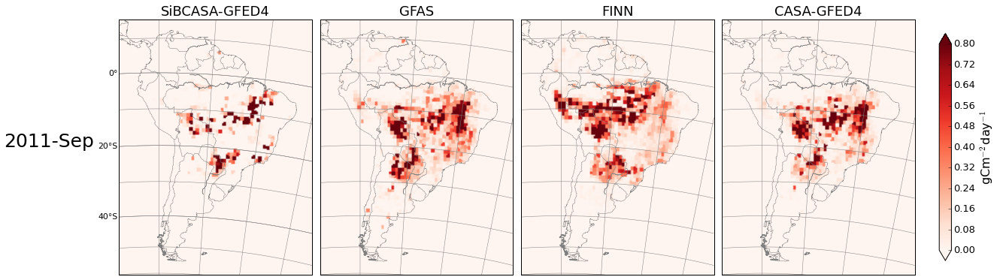

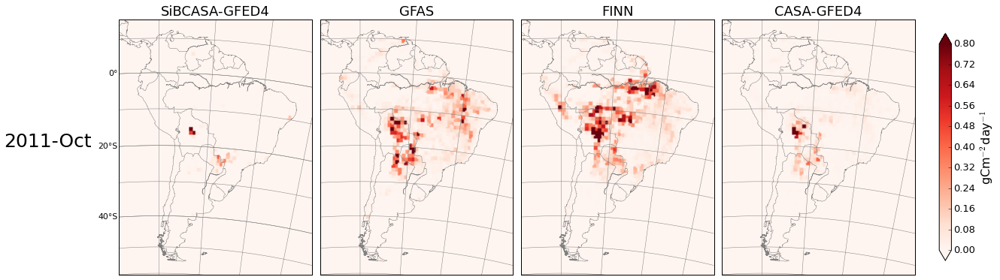

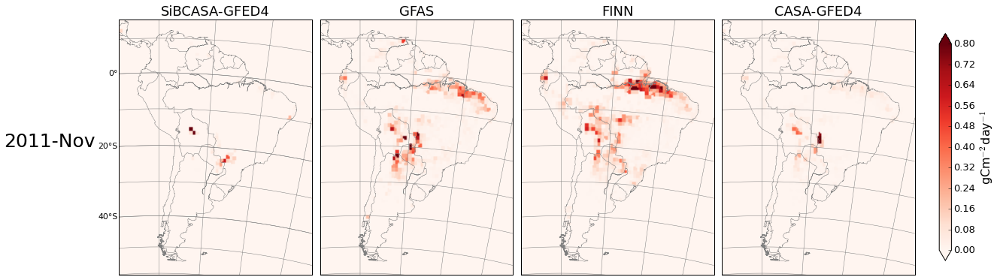

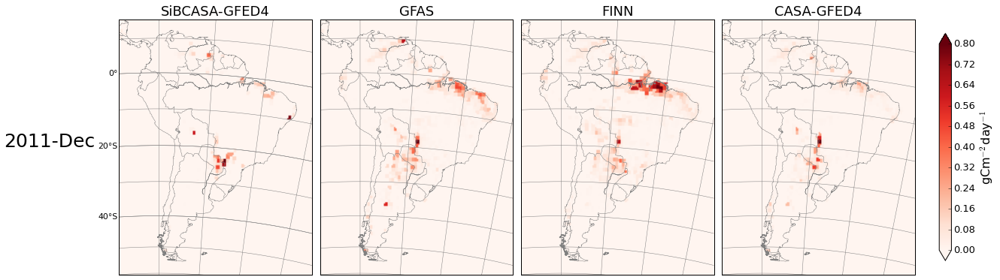

In [30]:
mon = ['nalgas','Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

for month in range (1,13):
    fig = plt.figure(1,figsize=(15,7))
    for ii in range(4):
        ax1 = plt.subplot2grid((1, 4), (0, ii), colspan=1)
        ax1.set_title(lbls[ii],fontsize=18)
        m,nx,ny = make_map()
        if ii == 0:
            m.drawparallels(np.arange(-40,10,20),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[1,0,0,0],fontsize=11)
        fluxmap = m.transform_scalar((fire_2011[ii][month])*fac1,lons,lats,nx,ny,order=0)
        q=m.imshow(fluxmap,cmap=get_cmap('Reds'),vmin=0,vmax=0.8)
        
    plt.figtext(-0.13,0.5,'2011-%s'%(mon[month]),fontsize=25)
    fig.subplots_adjust(right=1,top=0.9,wspace=0.2,hspace=0.05)
    cbar_ax = fig.add_axes([1.02, 0.2, 0.015, 0.6]) # left, bottom, width, height
    cbar = fig.colorbar(q, cax=cbar_ax, extend='both')
    cbar.ax.tick_params(labelsize=13)
    cbar.set_label(r'gCm$^{-2}$day$^{-1}$', fontsize = 16)
    plt.tight_layout()
    fig.savefig('SpatialDistribution_FireProducts%i%i.png'%(2011,month), bbox_inches='tight',DPI=1000) # I can add DPI to get higher resolution (200)
    plt.show()
    plt.close()    

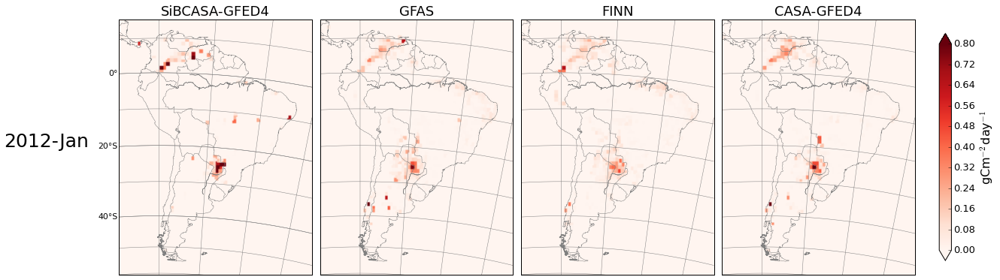

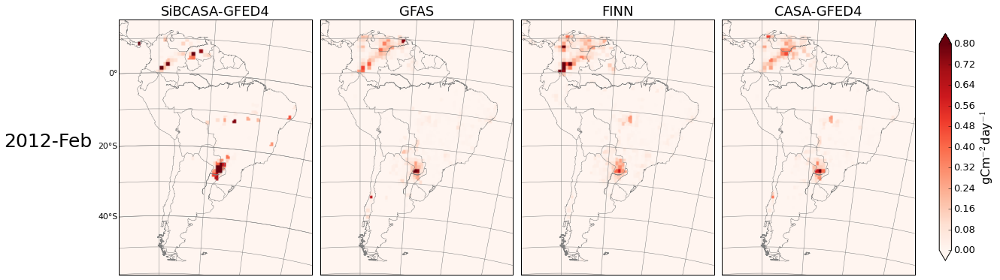

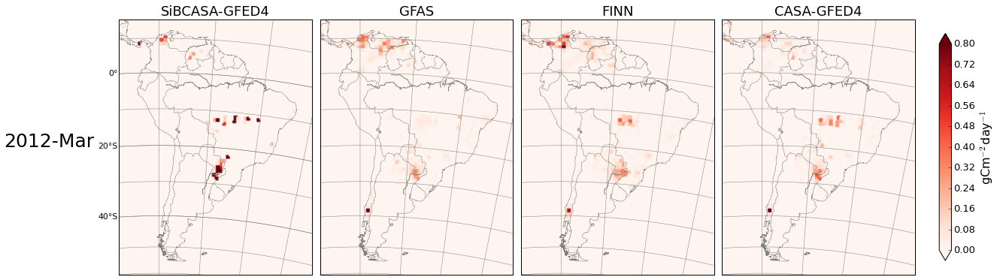

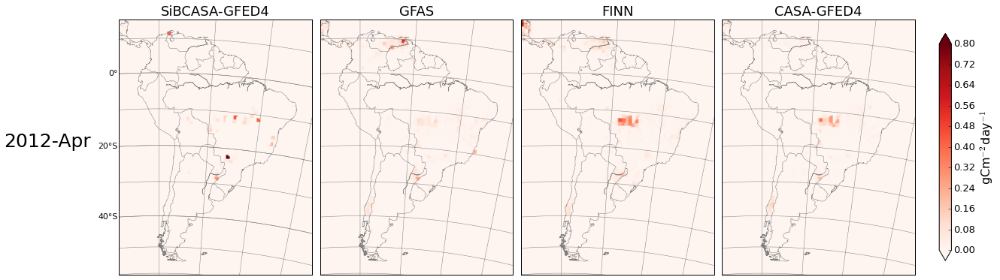

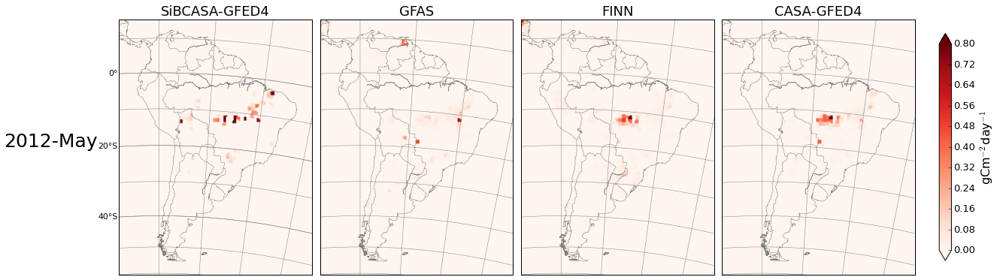

...

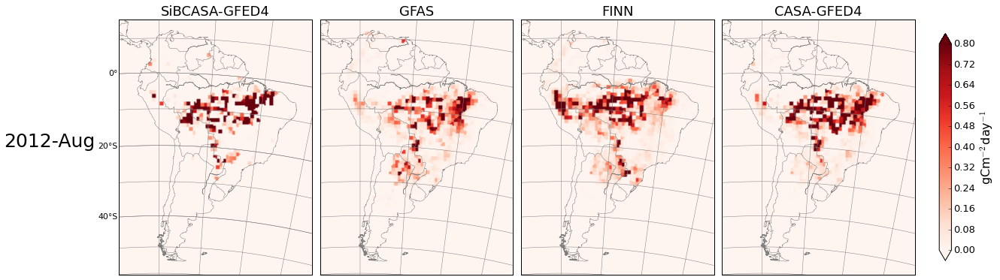

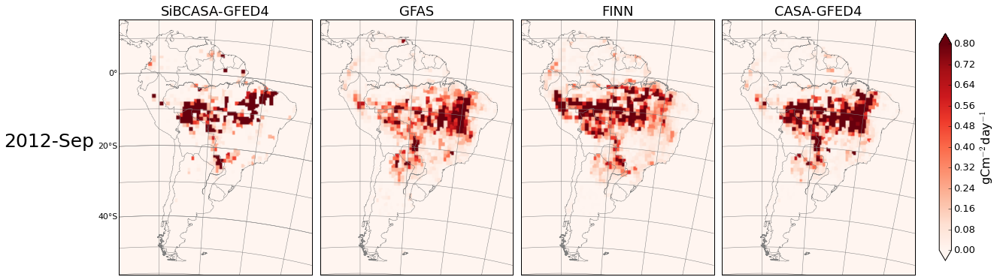

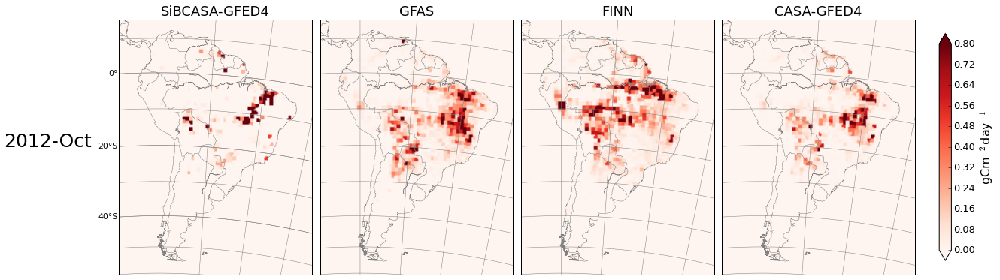

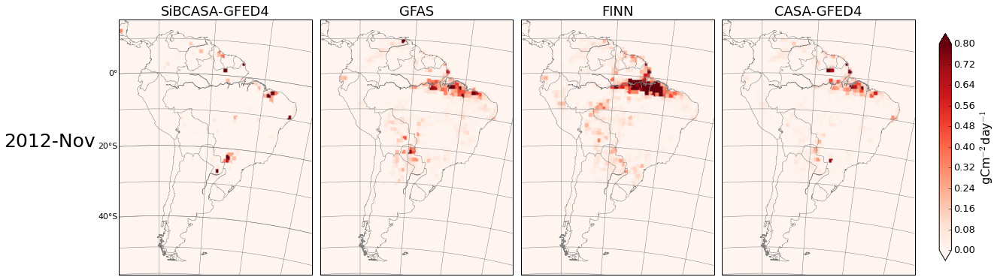

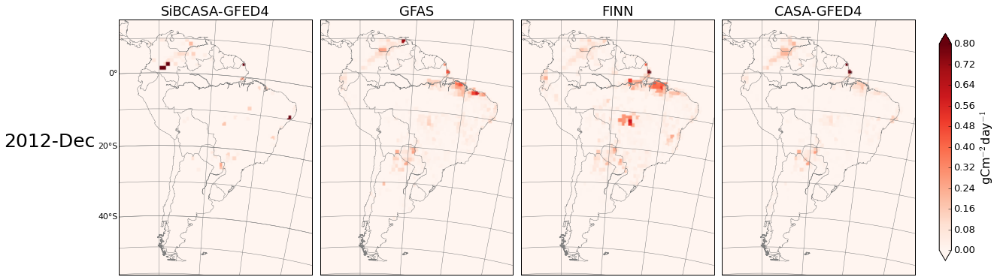

In [31]:
mon = ['nalgas','Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']

for month in range (1,13):
    fig = plt.figure(1,figsize=(15,7))
    for ii in range(4):
        ax1 = plt.subplot2grid((1, 4), (0, ii), colspan=1)
        ax1.set_title(lbls[ii],fontsize=18)
        m,nx,ny = make_map()
        if ii == 0:
            m.drawparallels(np.arange(-40,10,20),color='grey',linewidth=0.5,dashes=[1,0.0001],labels=[1,0,0,0],fontsize=11)
        fluxmap = m.transform_scalar((fire_2012[ii][month])*fac1,lons,lats,nx,ny,order=0)
        q=m.imshow(fluxmap,cmap=get_cmap('Reds'),vmin=0,vmax=0.8)
        
    plt.figtext(-0.13,0.5,'2012-%s'%(mon[month]),fontsize=25)
    fig.subplots_adjust(right=1,top=0.9,wspace=0.2,hspace=0.05)
    cbar_ax = fig.add_axes([1.02, 0.2, 0.015, 0.6]) # left, bottom, width, height
    cbar = fig.colorbar(q, cax=cbar_ax, extend='both')
    cbar.ax.tick_params(labelsize=13)
    cbar.set_label(r'gCm$^{-2}$day$^{-1}$', fontsize = 16)
    plt.tight_layout()
    fig.savefig('SpatialDistribution_FireProducts%i%i.png'%(2012,month), bbox_inches='tight',DPI=1000) # I can add DPI to get higher resolution (200)
    plt.show()
    plt.close()